### Imports / globals

In [1]:
import os

import pandas as pd
import numpy as np

import cv2
from PIL import Image as PILImage

import torch
import torchvision
from torchvision import transforms
from sklearn.metrics import cohen_kappa_score

from tensorboardX import SummaryWriter

from efficientnet_pytorch import EfficientNet

from utils import get_split_indices, prepare_train_directories,\
                  threshold_logits, plot_batch
from utils.checkpoint import *
from models.model_factory import get_resnet50
from datasets.dataset_factory import SmallDataset, ExternalDataset
from utils.train_helpers import train, train_single_epoch, evaluate_single_epoch
from utils.find_lr import LRFinder
from transforms.transform_factory import get_uncorr_transform

from fastai import *
from fastai.vision import *
from fastai.callbacks import *

%load_ext autoreload
%autoreload 2

/home/l3404/anaconda3/envs/wombat/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
def seed_everything(seed=1358):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything()

In [3]:
NUM_FOLD = 0 #0-4
EXPERIMENT_NAME = 'callback_{}'.format(NUM_FOLD)
RESULTS_DIR = os.path.join('results', EXPERIMENT_NAME)
CHECKPOINT_DIR = os.path.join(RESULTS_DIR, 'checkpoint')
DATA_DIR = 'data'
IMAGES_DIR = os.path.join(DATA_DIR, 'train-uncorr-300')
IMAGES_EXTERNAL_DIR = os.path.join(DATA_DIR, 'external-uncorr-300')
BATCH_SIZE = 32
IMAGE_SIZE = 300

prepare_train_directories(RESULTS_DIR)

In [4]:
# df_ext = pd.read_csv(os.path.join(DATA_DIR, 'external-1024-cropped.csv'))#.loc[:1000]
# df_ext['path'] = df_ext['id_code'].apply(lambda x: os.path.join(IMAGES_EXTERNAL_DIR, x + '.jpeg'))
# zeroes = df_ext[df_ext['diagnosis'] == 0].sample(n=2250, random_state=0)
# df_ext = df_ext[df_ext.diagnosis != 0]
# df_ext = pd.concat([df_ext, zeroes]).reset_index(drop=True)
# df_ext['is_valid'] = False

df_new = pd.read_csv(os.path.join(DATA_DIR, 'train.csv'))#.loc[:100]
df_new['path'] = df_new['id_code'].apply(lambda x: os.path.join(IMAGES_DIR, x + '.png'))
train_idx, val_idx = get_split_indices(df_new, target_column='diagnosis')[0]

df_train = df_new.iloc[train_idx]
df_train['is_valid'] = False

df_val = df_new.iloc[val_idx]
zeroes = df_val[df_val['diagnosis'] == 0].sample(n=100, random_state=0)
df_val = df_val[df_val.diagnosis != 0]
df_val = pd.concat([df_val, zeroes]).reset_index(drop=True)
df_val['is_valid'] = True


df = pd.concat([df_train, df_val]).reset_index(drop=True)
df = df.sample(frac=1).reset_index(drop=True)

/home/l3404/anaconda3/envs/wombat/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]


In [5]:
uncorr_transform = get_uncorr_transform(IMAGE_SIZE)

In [6]:
# def load_ben_color(path, sigmaX=10):
#     image = cv2.imread(path)
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     #image = crop_image_from_gray(image)
#     image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
#     image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        
#     return image

In [7]:
def mix_transform(path):
    image_path = path[2:]
    is_valid = df.loc[df.path == image_path].is_valid.values[0]
    image1 = PILImage.open(image_path)
    image1 = transforms.ToTensor()(image1)
    y_image1 = df.loc[df.path == image_path].diagnosis.values[0]
    
    if is_valid:
        return image1
    
    image2_path = df[df.diagnosis == y_image1].sample(1)['path'].values[0]
    image2 = PILImage.open(image2_path)
    image2 = transforms.ToTensor()(image2)
    
    if np.random.random() > 0.5:
        blend = torch.cat((image1[:, :, :150], image2[:, :, 150:]), 2)
    else:
        blend = torch.cat((image1[:, :150, :], image2[:, 150:, :]), 1)
    return blend

In [8]:
# def _load_format(path, convert_mode, after_open)->Image:

#     image = mix_transform(path)
#     image = transforms.ToPILImage()(image)
                    
#     return Image(pil2tensor(image, np.float32).div_(255)) #return fastai Image format

# vision.data.open_image = _load_format

In [9]:
def _load_format(path, convert_mode, after_open)->Image:
    image = PILImage.open(path)
#     image = transforms.ToTensor()(image)
#     image = uncorr_transform(image)
#     image = transforms.ToPILImage()(image)
                    
    return Image(pil2tensor(image, np.float32).div_(255)) #return fastai Image format

vision.data.open_image = _load_format

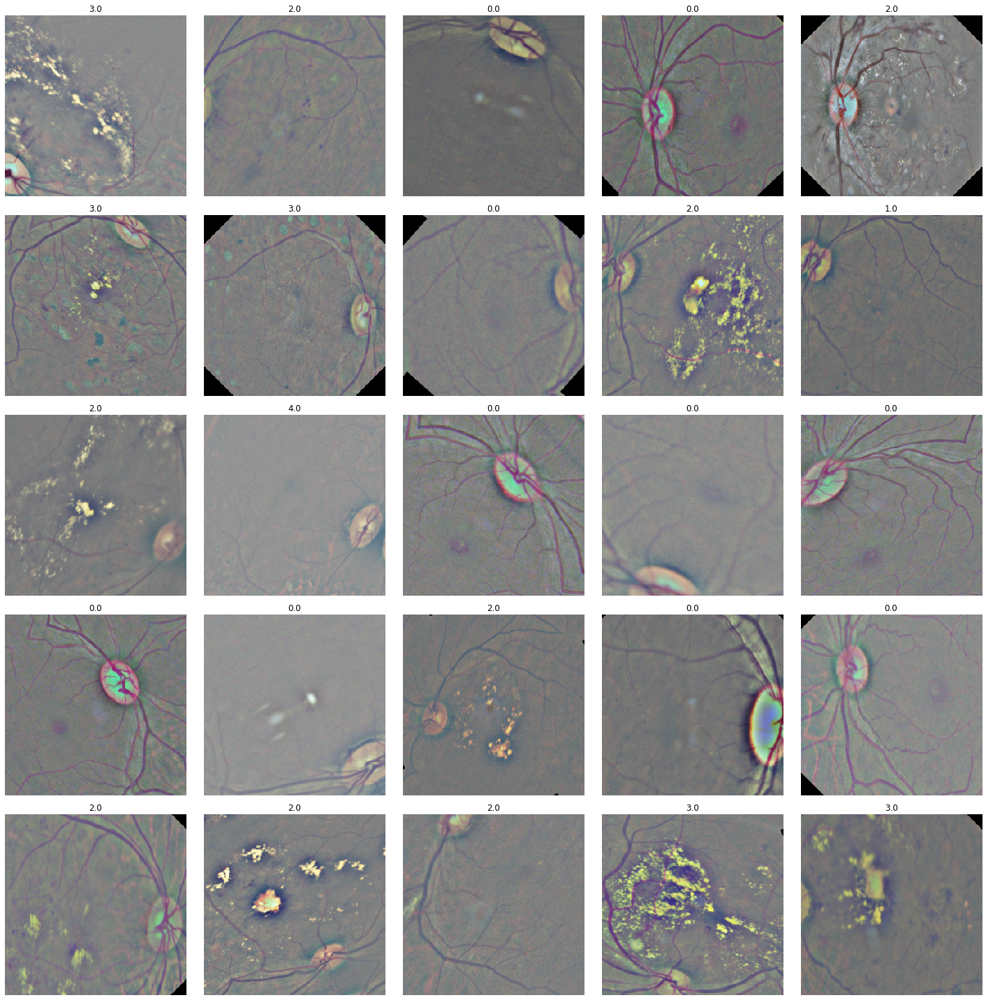

In [10]:
def quadratic_kappa(y_hat, y):
    return torch.tensor(cohen_kappa_score(torch.round(y_hat), y, weights='quadratic'),device='cuda:0')

tfms = get_transforms(do_flip=True, flip_vert=False, max_rotate=90, max_zoom=1.3, 
                      max_warp=0.0, max_lighting=0.2)
                      #xtra_tfms=[cutout(n_holes=(8,8), length=(IMAGE_SIZE//10, IMAGE_SIZE//10)) ])

data = (ImageList.from_df(df=df,path='',cols='path') 
        .split_from_df(col='is_valid')
        #.split_by_rand_pct(0.2, seed=42)
        .label_from_df(cols='diagnosis',label_cls=FloatList) 
        .transform(tfms, size=IMAGE_SIZE) 
        .databunch(bs=BATCH_SIZE, num_workers=12) 
        .normalize()  
       )

data.show_batch()

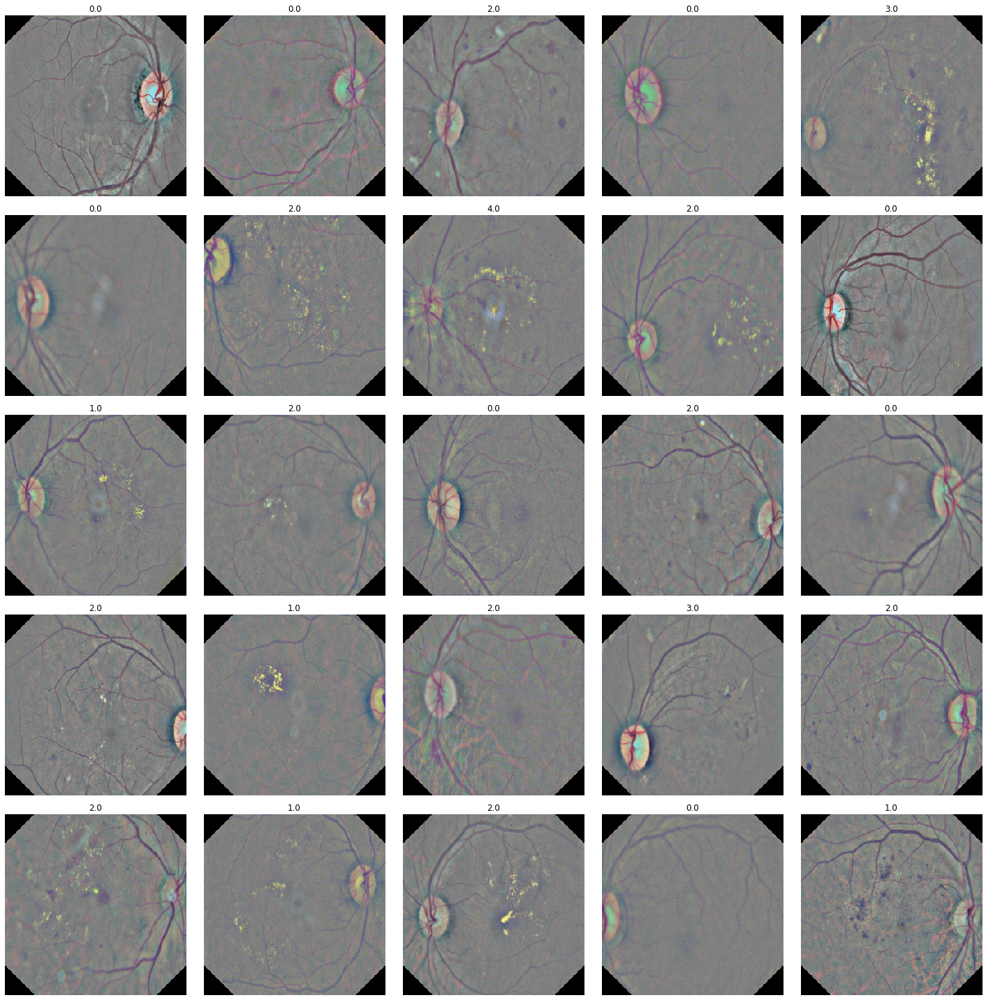

In [11]:
data.show_batch(ds_type=DatasetType.Valid)

In [12]:
# model = EfficientNet.from_pretrained('efficientnet-b3', num_classes=1) 
# learn = Learner(data, model ,metrics=[quadratic_kappa],
#                     model_dir=RESULTS_DIR, wd=1e-4).to_fp16()#.clip_grad(1)

# learn.split([model._blocks[i] for i in range(26)] + [model._conv_head])
# print(len(learn.layer_groups))

In [13]:
model = EfficientNet.from_pretrained('efficientnet-b3', num_classes=1) 
model._fc = nn.Sequential(nn.Dropout(0.25),
                          nn.Linear(1536, 512, bias=True),
                          nn.ReLU(),
                          nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                          nn.Dropout(0.5),
                          nn.Linear(512, 1)
                         )
learn = Learner(data, model ,metrics=[quadratic_kappa],
                    model_dir=RESULTS_DIR, wd=1e-4).to_fp16()#.clip_grad(1)
learn = learn.split([model._fc])

Loaded pretrained weights for efficientnet-b3


In [14]:
learn.freeze()
learn.fit_one_cycle(3, 1e-2)

epoch,train_loss,valid_loss,quadratic_kappa,time
0,1.290503,1.107011,0.539862,00:38
1,0.773632,1.687189,0.384871,00:38
2,0.609203,0.810147,0.643918,00:38


In [15]:
learn.unfreeze()
lr = 1e-3
learn.fit_one_cycle(20, lr, callbacks=[SaveModelCallback(learn, every='improvement', 
                                                        monitor='valid_loss',
                                                        name='bestmodel1')])

epoch,train_loss,valid_loss,quadratic_kappa,time
0,0.545391,0.671775,0.696914,00:49
1,0.496624,0.550647,0.713197,00:49
2,0.452597,0.548439,0.763647,00:49
3,0.440127,0.593427,0.724079,00:49
4,0.432479,1.147703,0.699404,00:46
5,0.460057,0.567949,0.758333,00:47
6,0.428032,0.608824,0.725737,00:45
7,0.422340,0.482515,0.805715,00:46
8,0.433980,0.602146,0.805214,00:45
9,0.406446,0.552481,0.781548,00:45


Better model found at epoch 0 with valid_loss value: 0.6717746257781982.
Better model found at epoch 1 with valid_loss value: 0.5506471395492554.
Better model found at epoch 2 with valid_loss value: 0.5484390258789062.
Better model found at epoch 7 with valid_loss value: 0.4825151860713959.
Better model found at epoch 12 with valid_loss value: 0.4328855276107788.
Better model found at epoch 14 with valid_loss value: 0.3845773935317993.
Better model found at epoch 15 with valid_loss value: 0.3588716983795166.


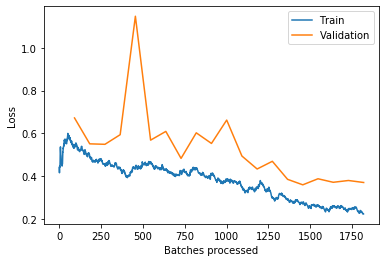

In [16]:
learn.recorder.plot_losses()

In [18]:
learn.validate()

[0.38744938, tensor(0.8372)]

In [19]:
learn.save(EXPERIMENT_NAME, return_path=True)

PosixPath('results/callback_0/callback_0.pth')

### Submission

In [30]:
learn = learn.load(EXPERIMENT_NAME)

sample_df = pd.read_csv(os.path.join(DATA_DIR, 'sample_submission.csv'))
#sample_df = sample_df.rename(columns={'id_code': 'name', 'diagnosis': 'label'})
sample_df['path'] = sample_df['id_code'].apply(lambda x: os.path.join('data/test', x + '.png'))

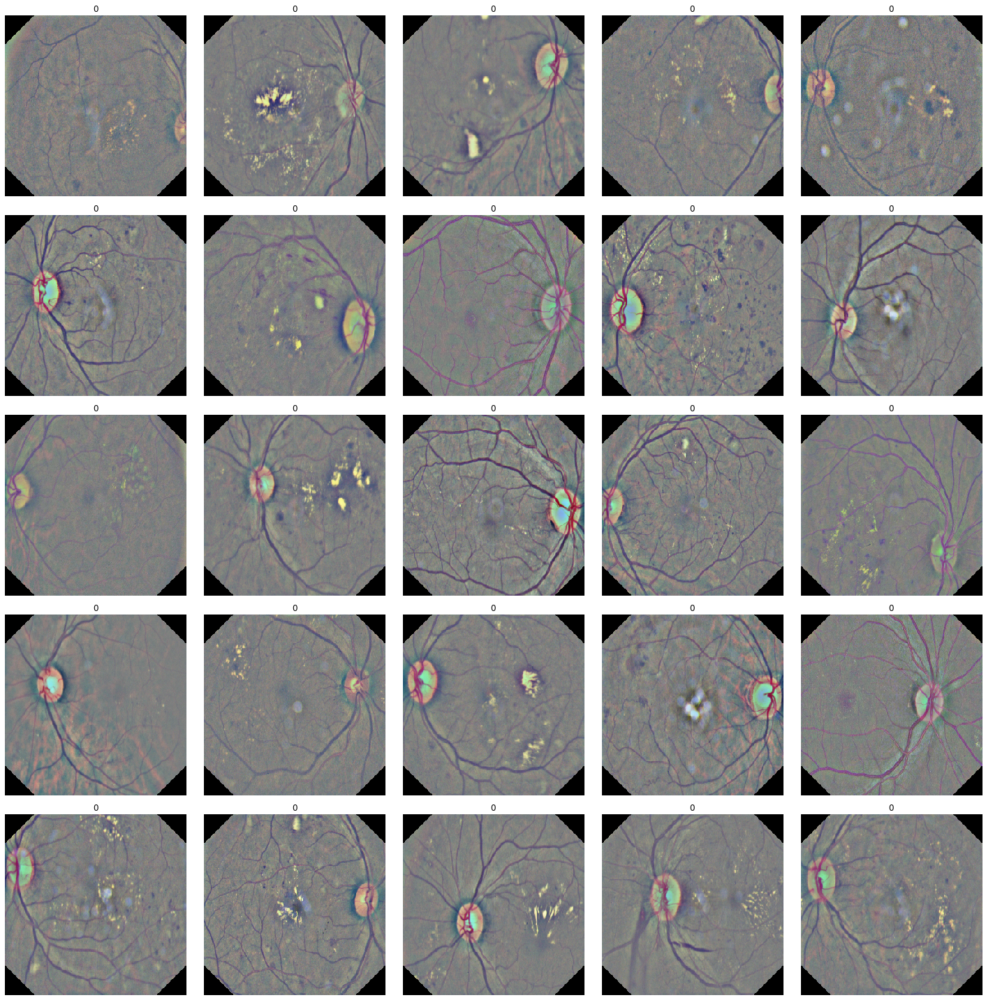

In [31]:
def _load_format(path, convert_mode, after_open)->Image:
    image = PILImage.open(path)
    image = transforms.ToTensor()(image)
    image = uncorr_transform(image)
    image = transforms.ToPILImage()(image)
                    
    return Image(pil2tensor(image, np.float32).div_(255)) #return fastai Image format

vision.data.open_image = _load_format
learn.data.add_test(ImageList.from_df(sample_df,path='',cols='path'))
data.show_batch(ds_type=DatasetType.Test)

In [32]:
preds,y = learn.get_preds(DatasetType.Test)
preds_t = threshold_logits(preds)
print(preds[:10])

tensor([[1.6201],
        [3.2578],
        [2.5234],
        [2.0059],
        [2.0625],
        [2.0547],
        [3.0840],
        [1.2021],
        [3.0801],
        [0.1425]])


In [33]:
sample_df.diagnosis = preds_t.astype(int)
sample_df.drop('path', axis=1, inplace=True)
sample_df.head(10)

,id_code,diagnosis
0,0005cfc8afb6,2
1,003f0afdcd15,3
2,006efc72b638,3
3,00836aaacf06,2
4,009245722fa4,2
5,009c019a7309,2
6,010d915e229a,3
7,0111b949947e,1
8,01499815e469,3
9,0167076e7089,0


In [ ]:
#sub_name = 'submission_{}.csv'.format(EXPERIMENT_NAME)
#sample_df.to_csv(sub_name,index=False)

In [34]:
tensor([[1.6201],
        [3.2578],
        [2.5234],
        [2.0059],
        [2.0625],
        [2.0547],
        [3.0840],
        [1.2021],
        [3.0801],
        [0.1425]])

tensor([[1.6201],
        [3.2578],
        [2.5234],
        [2.0059],
        [2.0625],
        [2.0547],
        [3.0840],
        [1.2021],
        [3.0801],
        [0.1425]])